# Key challenges

I think there are two major categories of challenges in deploying a machine learning model. <br>
First, are the machine learning or the statistical issues, and second, are the software engine issues. 

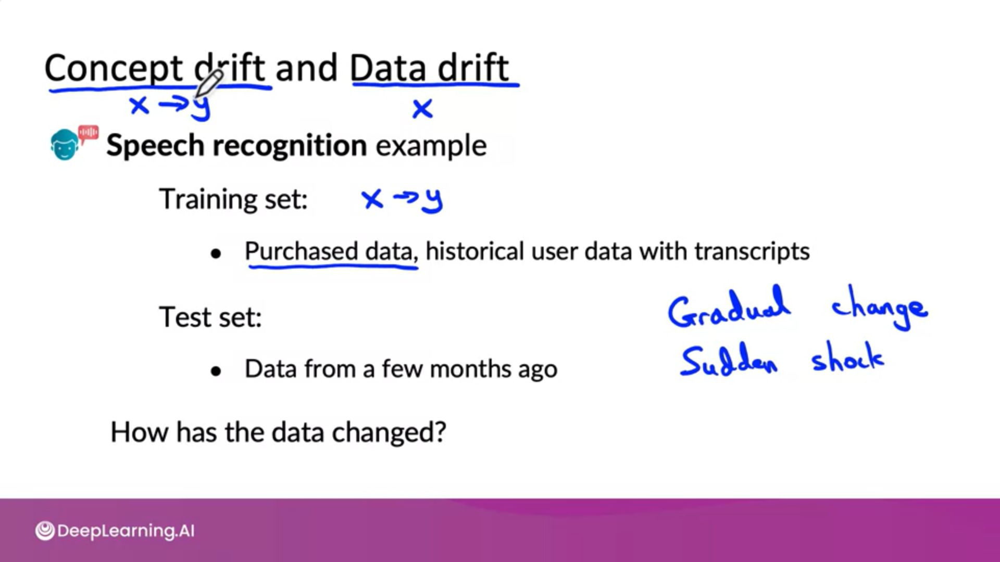

`Loosely, this means what if your data changes after your system has already been deployed? ` <br>
*  Let's walk through a second example using speech recognition. I train a few speech recognition systems, and when I built speech systems, quite often I would have some purchased data. 
* This would be some purchased or licensed data, which includes both the input x, the audio, as well as the transcript y that the speech system supports it's output. In addition to data that you might purchase from a vendor, you might also have historical user data of user speaking to your application together with transcripts of that raw user data.
* Such user data, of course, should be collected with very clear user opt-in permission and clear safeguards for user privacy. 
* After you've trained your speech recognition system on a data set like this, you might then evaluate it on a test set, but because speech data does change over time, when I build speech recognition systems, sometimes I would collect a dev set or hold out validation set as well as test set comprising data from just the last few months.
* You can test it on fairly recent data to make sure your system works, even on relatively recent data. After you push the system to deployments, the question is, will the data change or after you've run it for a few weeks or a few months, has the data changed yet again? 
* The data has changed, such as the language changes or maybe people are using a brand new model of smartphone which has a different microphone, so the audio sounds different, then the performance of a speech recognition system can degrade. It's important for you to recognize how the data has changed, and if you need to update your learning algorithm as a result.
* When data changes, sometimes it is a gradual change, such as the English language which does change, but changes very slowly with new vocabulary introduced at a relatively slow rate. Sometimes data changes very suddenly where there's a sudden shock to a system. For example, when COVID-19 the pandemic hit, a lot of credit card fraud systems started to not work because the purchase patterns of individuals suddenly changed.

Sometimes the terminology of how to describe these data changes is not used completely consistently, but sometimes the `term data drift` is used to describe if the input distribution x changes, such as if a new politician or celebrity suddenly becomes well known and he's mentioned much more than before.

The `term concept drift` refers to if the desired mapping. From x to y changes such as if, before COVID-19. Perhaps for a given user, a lot of surprising online purchases, should have flagged that account for fraud. After the start of COVID-19, maybe those same purchases, would not have really been any cause for alarm, in terms of flagging. That the credit card may have been stolen.

Another example of Concept drift, let's say that x is the size of a house, and y is the price of a house, because you're trying to estimate housing prices. If because of inflation or changes in the market, houses may become more expensive over time. The same size house, will end up with a higher price. That would be Concept drift.

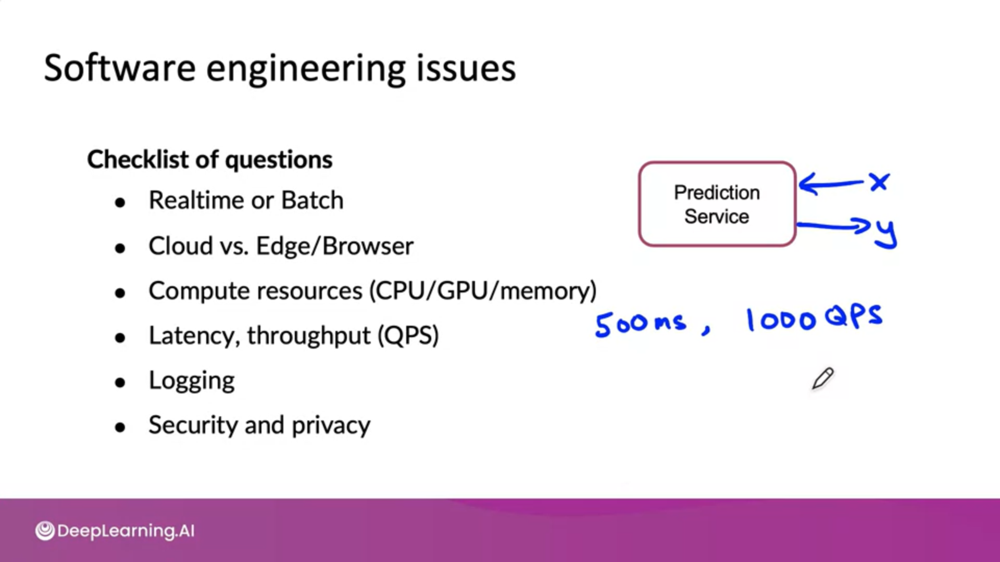

* Today there are many speech recognition systems that run in the cloud, because having the compute resources of the cloud, allows for more accurate speech recognition. There are also some speech systems, for example, a lot of speech systems within cars, actually run at the edge. There are also some mobile speech recognition systems that work, even if your Wi-Fi is turned off. Those would be examples of speech systems that run at the edge.
* When building a prediction service, it's also useful to take into account, how much computer resources you have. There have been quite a few times where I trained a neural network on a very powerful GPU, only to realize that I couldn't afford an equally powerful set of GPUs for deployments, and wound up having to do something else to compress or reduce the model complexity.

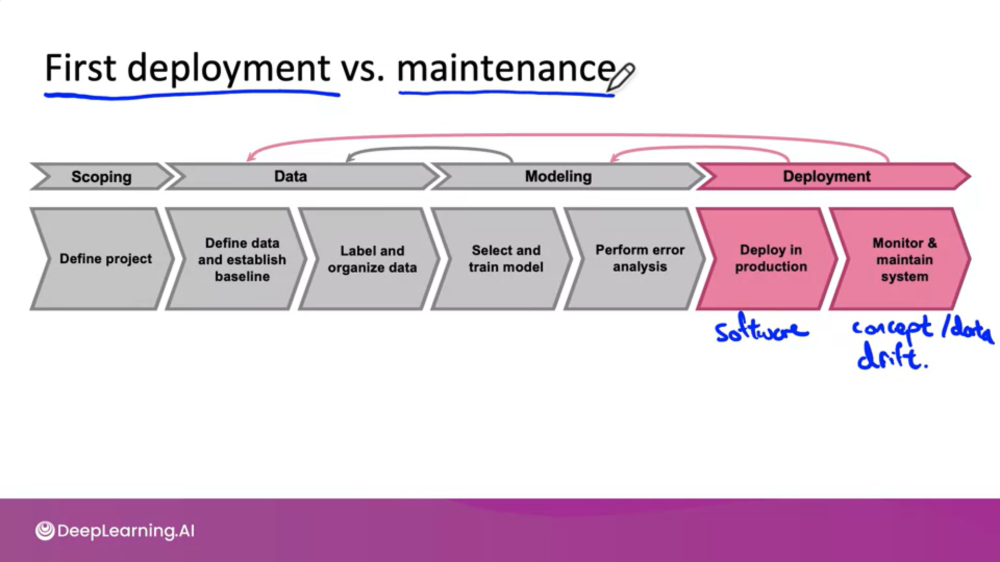

One of the things you see when you're building machine learning systems is that the practices for the very first deployments will be quite different compared to when you are updating or maintaining a system that has already previously been deployed. I know that to some engineers that view deploying the machine learning model as getting to the finish line. Unfortunately, I think the first deployment means you may be only about halfway there, and the second half of your work is just starting only after your first deployment, because even after you've deployed there's a lot of work to feed the data back and maybe to update the model, to keep on maintaining the model even in the face of changes to the data. 

# Deployment patterns

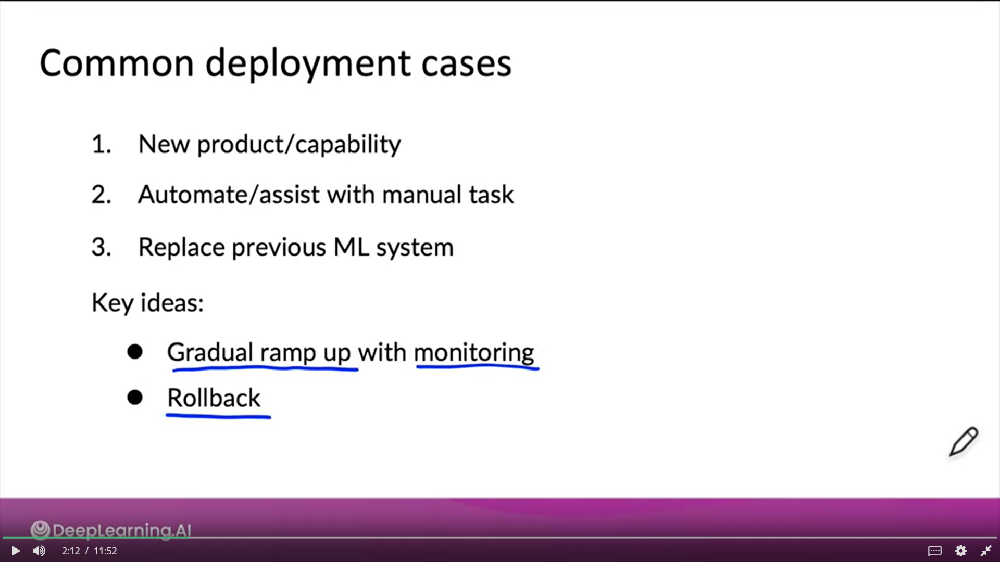

* One type of deployment is if you are offering a new product or capability that you had not previously offered.
* A second common deployment use case is if there's something that's already being done by a person, but we would now like to use a learning algorithm to either automate or assist with that task. 
* And finally, a third common deployment case is if you've already been doing this task with a previous implementation of a machine learning system, but you now want to replace it with hopefully an even better one.

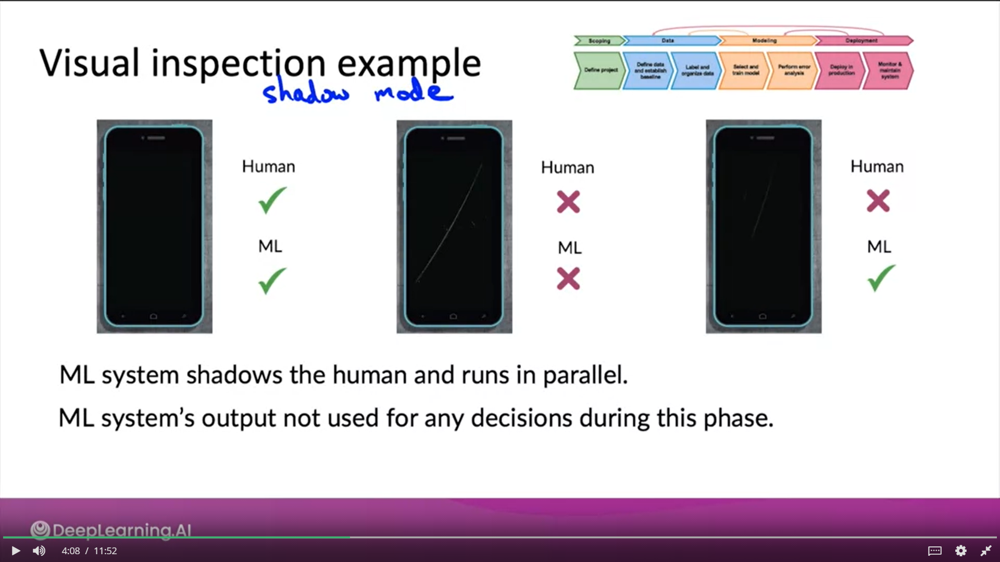

The purpose of `a shadow mode deployment is that allows you to gather data of how the learning algorithm is performing and how that compares to the human judgment`. And by something the it offers you can then verify if the learning algorithm's predictions are accurate and therefore use that to decide whether or not to maybe allow the learning algorithm to make some real decisions in the future. So when you already have some system that is making good decisions and that system can be human inspectors or even an older implementation of a learning algorithm. Using a shadow mode deployment can be a very effective way to let you verify the performance of a learning algorithm before letting them make any real decisions. 

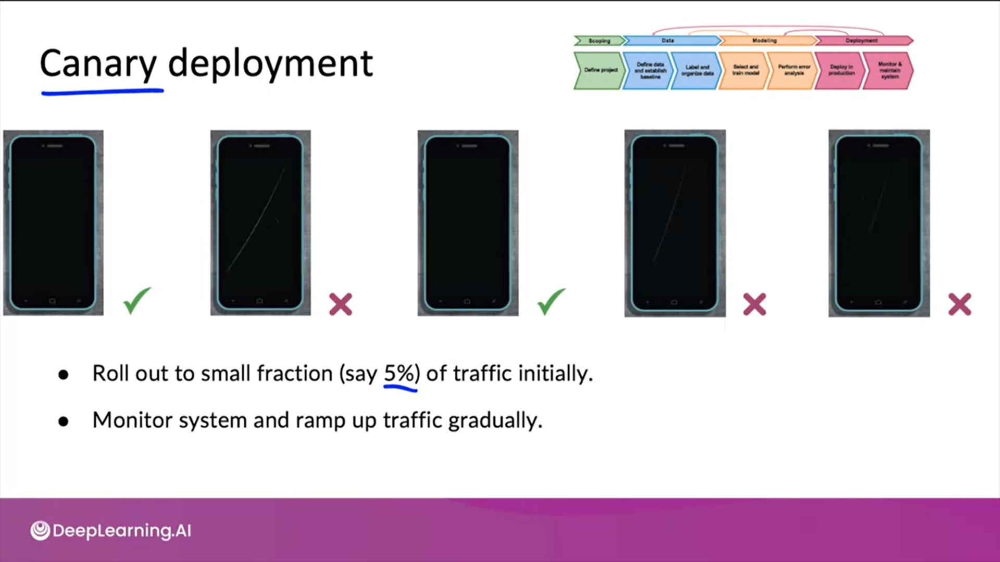

When you are ready to let a learning algorithm start making real decisions, a common deployment pattern is to use a canary deployment.

And in a `canary deployments` you would roll out to a small fraction, maybe 5%, maybe even less of traffic initially and start let the algorithm making real decisions. But by running this on only a small percentage of the traffic, hopefully, if the algorithm makes any mistakes it will affect only a small fraction of the traffic. 

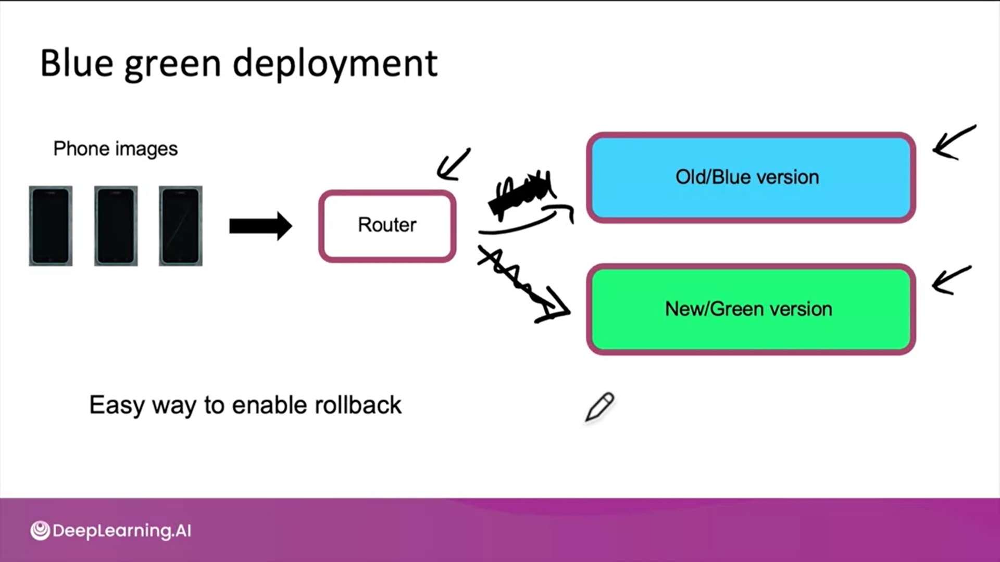

As you can imagine, whether use shadow mode, canary mode, blue green, or some of the deployment pattern, quite a lot of software is needed to execute this. MLOps tools can help with implementing these deployment patterns or you can implement it yourself.

One of the most useful frameworks I have found for thinking about how to deploy a system is to think about deployment not as a 0, 1 is either deploy or not deploy, but instead to design a system thinking about what is the appropriate degree of automation. 

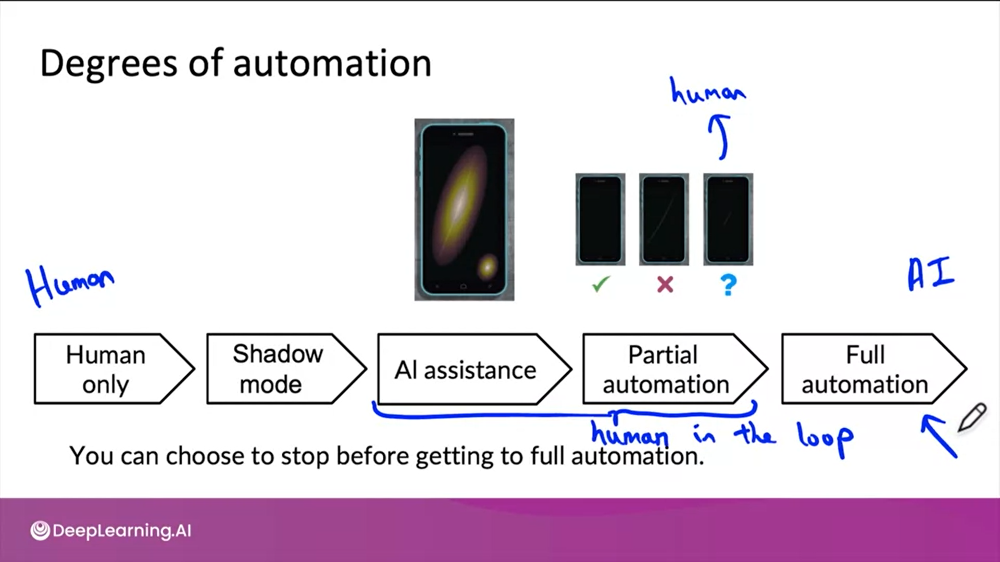

# Monitoring

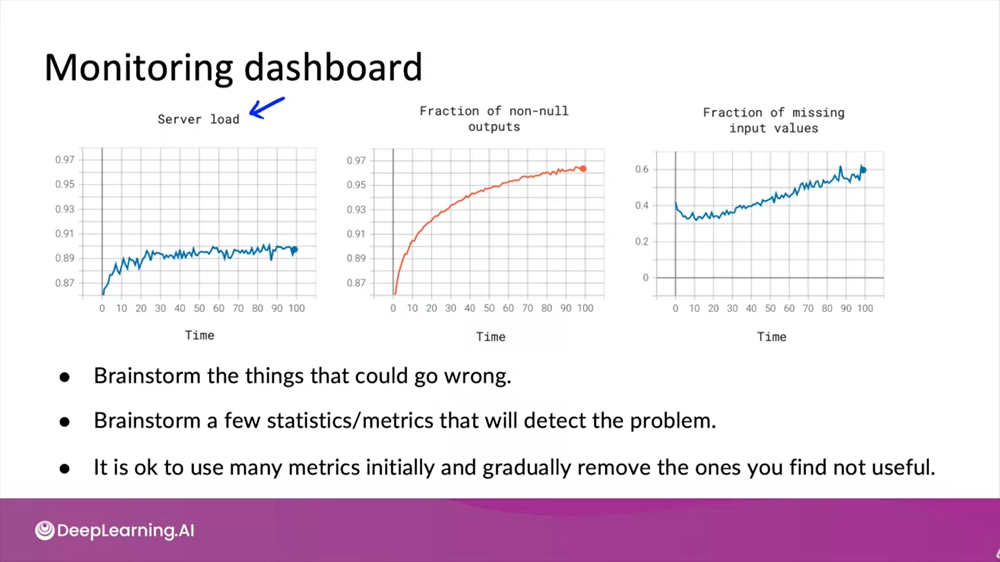

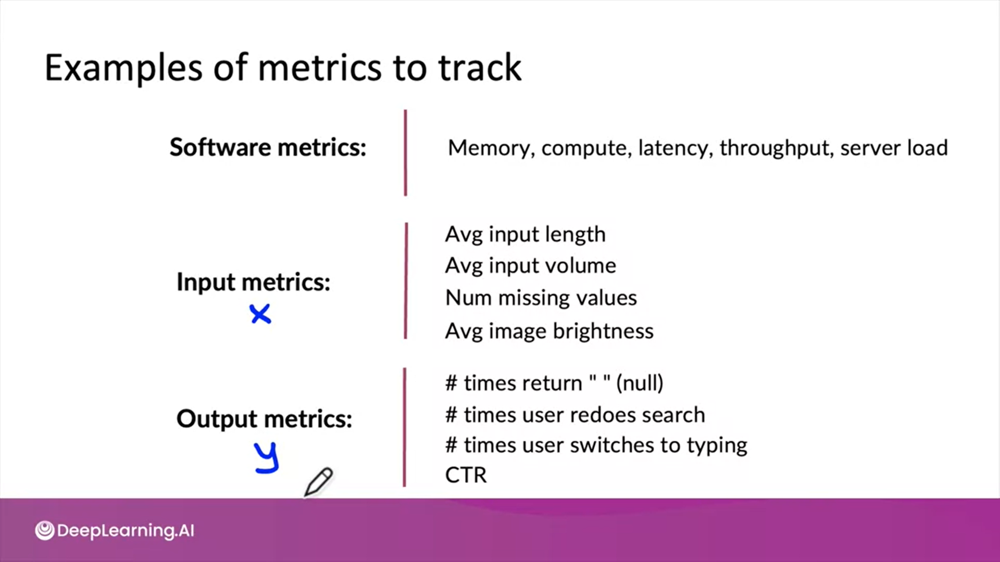

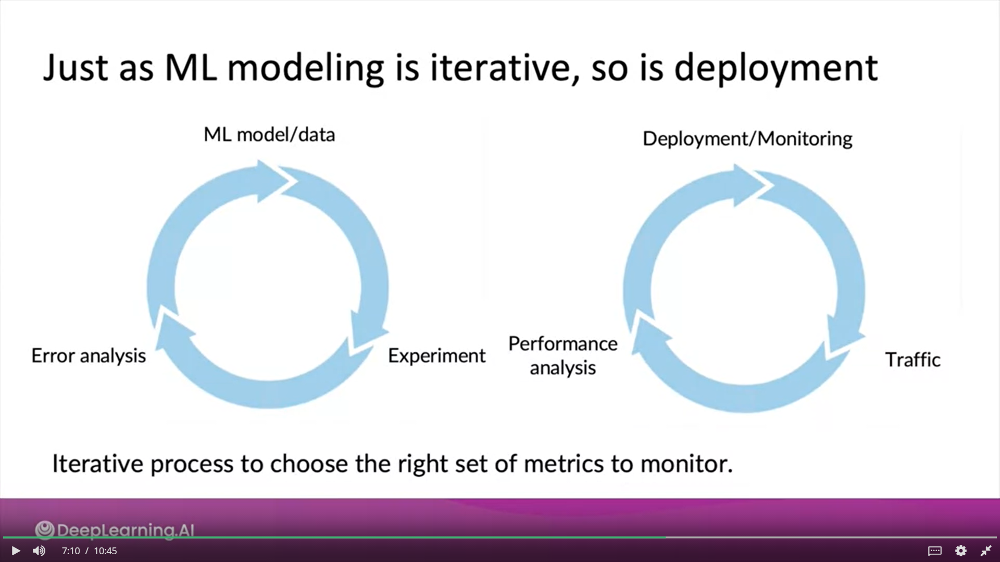

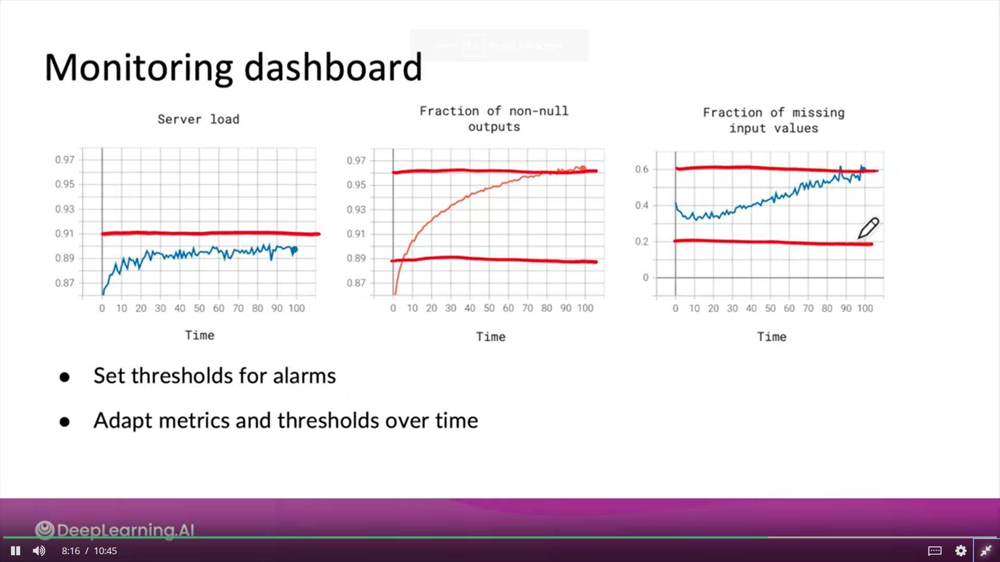

you may decide based on this set, if the server load ever goes above 0.91, that may trigger an alarm or a notification to let you know or let the team know to see if there's a problem and maybe spin up some more servers. Or if the fashion of non-null plus goals above or beyond certain thresholds that might trigger an alarm. Or if they're not, fraction of missing values goes above or below some set of thresholds, maybe that should trigger an alarm, and it is okay if you adapt the metrics and the thresholds over time to make sure that they are flagging to you the most relevant cases of concern. If something goes wrong with your learning algorithm, if is a software issue such as server load is too high, then that may require changing the software implementation, or if it is a performance problem associated with the accuracy of the learning algorithm, then you may need to update your model.

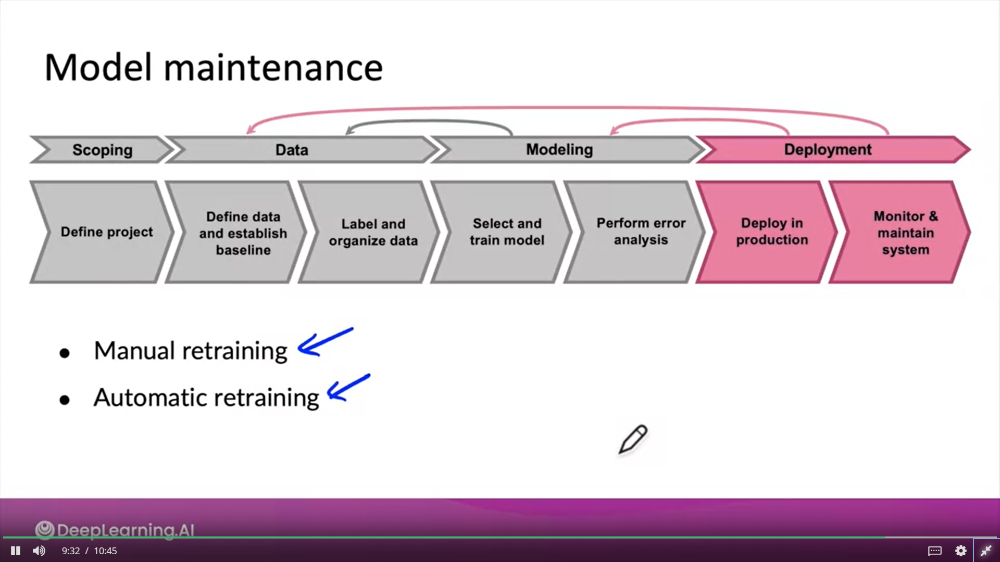

# Pipeline monitoring

Many AI systems are not just a single machine learning model running a prediction service, but instead involves a pipeline of multiple steps. So what a machine learning pipelines and how do you build monitoring systems for that? 

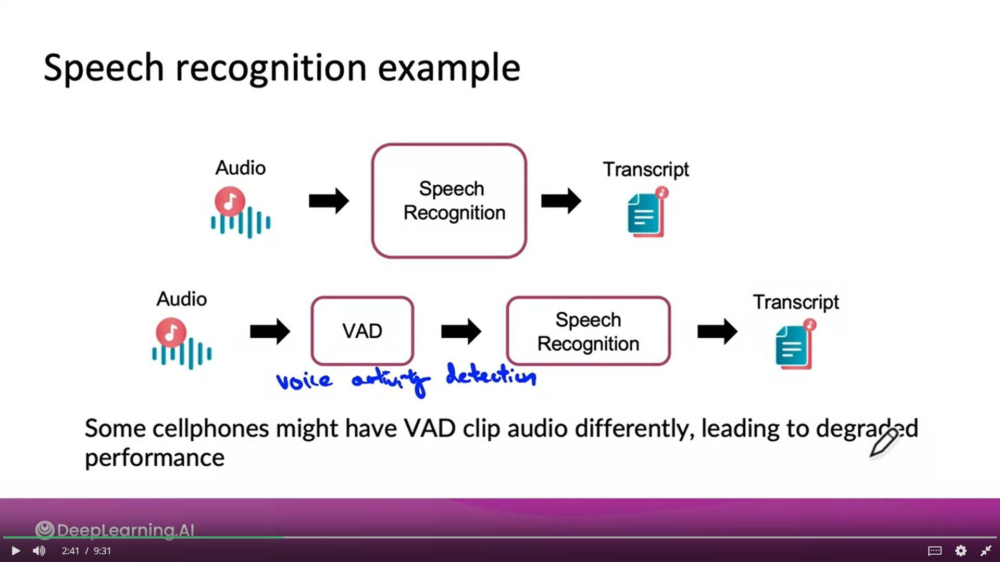

VAD and Speech recognition are 2 different models in which changes in one of them also affect the other module

And the reason we use a voice activity detection or VAD module is because if say, your speech recognition system runs in the cloud. You don't want to stream more bandwidth than you have to to your cloud server. And so the voice activity detection module looks at the long stream of audio on your cell phone and clips or shortens the audio to just the part where someone is talking and streams only that to the cloud server to perform the speech recognition.

So this is an example of a machine learning pipeline where there is one step usually done by learning album as well to decide if someone is talking or not. And then the second step, also done by a learning algorithm to generate the text transcript. 

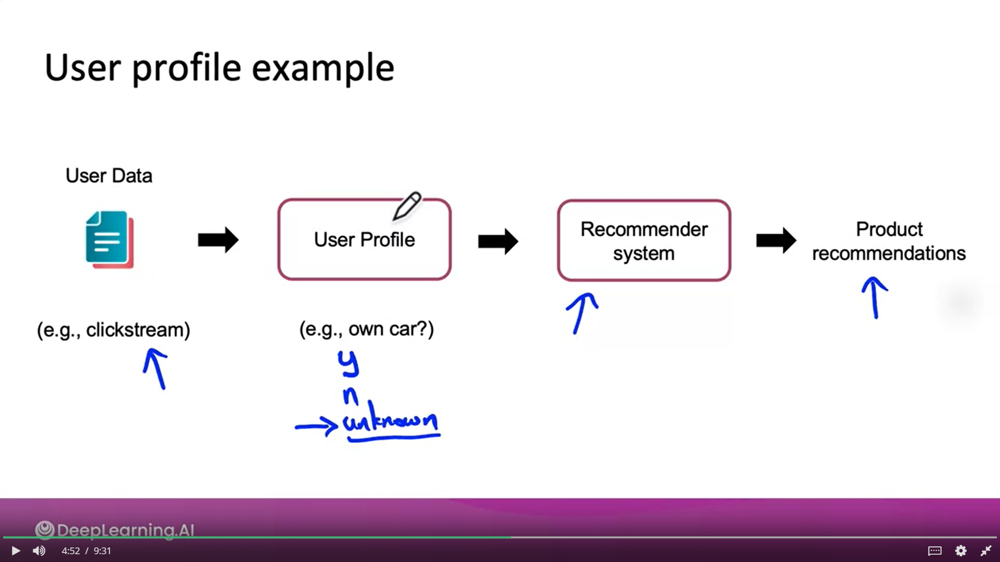

* Now, if something about the click stream data changes, maybe this input distribution changes, then maybe over time if we lose our ability to figure out if a user owns a car, then the percentage of the unknown tag here may go up. And because the user profiles output changes, the input to the recommended system now changes and this might affect the quality of the product recommendations.
* When you have a machine learning pipelines, these cascading effects in the pipeline can be complex to keep track on. But if the percentage of unknown labels does go up, this could be something that you want to be alerted to so that you can update the recommend the system if needed to make sure you continue to generate high quality product recommendations. 

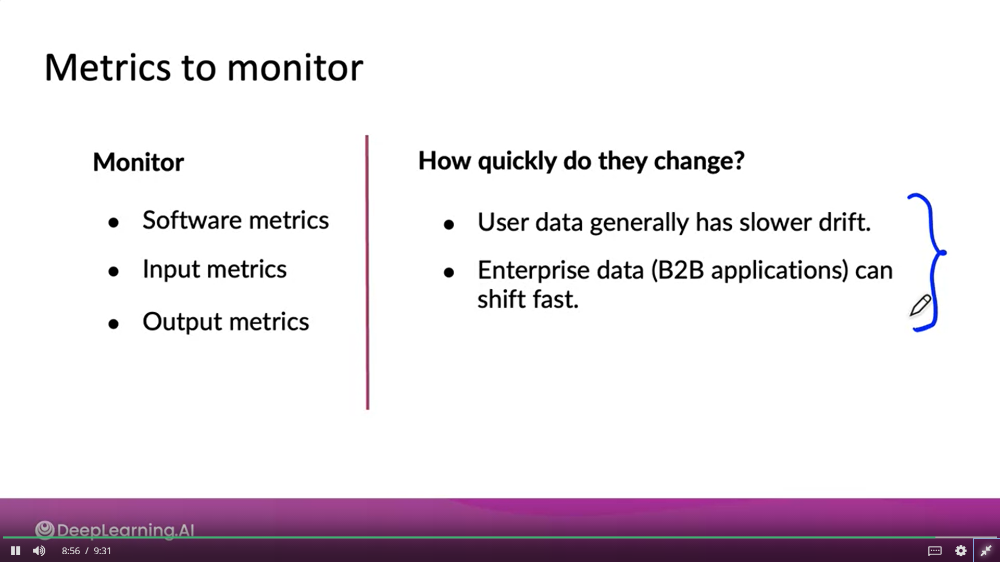

* Face recognition system - data changes slowly . Hairstyle and dressing sense changes but people identity remains same for long time
* Covid-19- It has a a very sudden effect on all part of socities data achanges rapidly.